In [1]:
# LIBRAIRIES IMPORT
# Data
import pandas as pd
import numpy as np
from sklearn.cluster import Birch # Replace with your model

# Visualisation
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
import folium

# Metrics
from sklearn import metrics

%matplotlib inline

In [52]:
# DATA IMPORT
uber = pd.read_csv('../data/Uber.csv')
uber.drop(['Unnamed: 0', 'Hour', 'DayOfWeek'], axis = 1, inplace=True)
uber.head()

,Date/Time,Lat,Lon,Base,Period,DayType
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,0,1
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,0,1
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,0,1
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,0,1
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,0,1


In [53]:
# SAMPLING
frac_sample = 1
uber_sample = uber.sample(frac = frac_sample, random_state=42)

In [3]:
# MODEL DESCRIPTION
Birch?

Init signature:
Birch(
    *,
    threshold=0.5,
    branching_factor=50,
    n_clusters=3,
    compute_labels=True,
    copy=True,
)
Docstring:     
Implements the BIRCH clustering algorithm.

It is a memory-efficient, online-learning algorithm provided as an
alternative to :class:`MiniBatchKMeans`. It constructs a tree
data structure with the cluster centroids being read off the leaf.
These can be either the final cluster centroids or can be provided as input
to another clustering algorithm such as :class:`AgglomerativeClustering`.

Read more in the :ref:`User Guide <birch>`.

.. versionadded:: 0.16

Parameters
----------
threshold : float, default=0.5
    The radius of the subcluster obtained by merging a new sample and the
    closest subcluster should be lesser than the threshold. Otherwise a new
    subcluster is started. Setting this value to be very low promotes
    splitting and vice-versa.

branching_factor : int, default=50
    Maximum number of CF subclusters in each node. 

In [54]:
# MODEL FITTING
X = uber_sample[['Lat','Lon']]
model = Birch(threshold = 0.01, n_clusters = 5)
model.fit(X)

Birch(n_clusters=5, threshold=0.01)

In [55]:
# MODEL PREDICTION
X_predict = X.copy()
X_predict['cluster'] = model.fit_predict(X)
X_predict.cluster.value_counts()

4    813914
2      8578
1      3709
0      2586
3       488
Name: cluster, dtype: int64

/var/folders/lc/q1lfsr356d11n9j92x9l_x080000gn/T/ipykernel_50654/3448684898.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


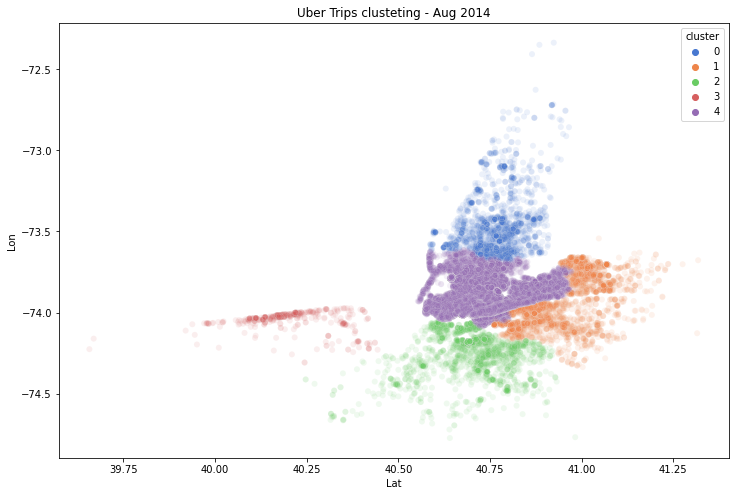

In [56]:
# VISUALISATION

# Seaborn

f,ax = plt.subplots(1,1, figsize=(12,8))
sns.scatterplot(data = X_predict, x='Lat', y='Lon', hue='cluster', ax = ax, palette='muted', alpha = 0.1)
ax.set_title('Uber Trips clusteting - Aug 2014')
f.show()

In [57]:
# Folium

# Initialise map (centered on mean)
map_clusters = folium.Map(location=[uber.Lat.mean(), uber.Lon.mean()],
                zoom_start=9, control_scale=False, zoom_control = False, scrollWheelZoom=False, dragging=False)

# Number of points to show
nb_points = 10000
df_map = X_predict.sample(frac = nb_points/X_predict.shape[0], random_state=42)


# set color scheme for the clusters
x = np.arange(5)
ys = [i + x + (i*x)**2 for i in range(5)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, cluster in zip(df_map['Lat'], df_map['Lon'], df_map['cluster']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.5,
        stroke = False).add_to(map_clusters)
       
map_clusters

In [58]:
# SCORING

n_clusters = len(X_predict.cluster.unique())
labels = model.labels_

print(f'Estimated number of clusters: {n_clusters:d}')
print(f'Silhouette Score: {metrics.silhouette_score(X, labels, metric="sqeuclidean", random_state=42, sample_size = 10000):0.3f}')
print(f'Calinski-Harabasz Score: {metrics.calinski_harabasz_score(X, labels):.0f}')
print(f'Davies-Bouldin Score: {metrics.davies_bouldin_score(X, labels):0.3f}')

Estimated number of clusters: 5
Silhouette Score: 0.864
Calinski-Harabasz Score: 84395
Davies-Bouldin Score: 0.751


In [59]:
# TEST WITH SEPTEMBER DATA
sept = pd.read_csv('../data/uber-raw-data-sep14.csv')
sept_sample = sept.sample(frac = frac_sample, random_state=42)
X_sept = sept_sample[['Lat','Lon']]
X_sept_predict = X_sept.copy()
X_sept_predict['cluster'] = model.predict(X_sept)

In [60]:
map_clusters_sept = folium.Map(location=[sept.Lat.mean(), sept.Lon.mean()],
                zoom_start=9, control_scale=False, zoom_control = False, scrollWheelZoom=False, dragging=False)

# Number of points to show
nb_points = 10000
df_map_sept = X_sept_predict.sample(frac = nb_points/X_sept_predict.shape[0], random_state=42)


# set color scheme for the clusters
x = np.arange(5)
ys = [i + x + (i*x)**2 for i in range(5)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, cluster in zip(df_map_sept['Lat'], df_map_sept['Lon'], df_map_sept['cluster']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.5,
        stroke = False).add_to(map_clusters_sept)
       
map_clusters_sept

In [63]:
n_clusters = len(X_sept_predict.cluster.unique())
labels = X_sept_predict.cluster

print(f'Estimated number of clusters: {n_clusters:d}')
print(f'Silhouette Score: {metrics.silhouette_score(X_sept, labels, metric="sqeuclidean", random_state=42, sample_size = 10000):0.3f}')
print(f'Calinski-Harabasz Score: {metrics.calinski_harabasz_score(X_sept, labels):.0f}')
print(f'Davies-Bouldin Score: {metrics.davies_bouldin_score(X_sept, labels):0.3f}')

Estimated number of clusters: 5
Silhouette Score: 0.885
Calinski-Harabasz Score: 86886
Davies-Bouldin Score: 0.770
